In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import os
# import rapids_singlecell as rsc
from tqdm import tqdm

import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# import session_info
# session_info.show()

In [3]:
sc.settings.set_figure_params(dpi=120)

# Read in

In [4]:
objects_dir = '/rfs/project/rfs-iCNyzSAaucw/kk837/data_objects/Foetal/Xenium'
path_adata = f'{objects_dir}/C194-HEA-0-FFPE-1_Hst45-HEA-0-FFPE-1_concat_5K_filtered_raw.h5ad'
adata = sc.read_h5ad(path_adata)
print(adata.X.data[:5])
adata

[5. 1. 1. 2. 2.]


AnnData object with n_obs × n_vars = 362277 × 5001
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'n_genes', 'tissue_block_id', 'celltypist_coarse', 'conf_score_coarse', 'celltypist_coarse_fin', 'celltypist_coarse2midmod', 'conf_score_coarse2midmod', 'celltypist_mid_fin', 'celltypist_midmod2fine', 'conf_score_midmod2fine', 'pca_harmony_leiden_0.2', 'pca_harmony_leiden_0.3', 'pca_harmony_leiden_0.4', 'pca_harmony_leiden_0.5', 'pca_harmony_leiden_0.8', 'pca_harmony_leiden_1.0', 'pca_harmony_leiden_1.5', 'pca_harmony_leiden_2.0', 'pca_harmony_leiden_

In [5]:
adata.obs['coarse_grain_pre'].value_counts()

coarse_grain_pre
Cardiomyocytes          183226
unclassified_mixture     89888
MesenchymalCells         61655
NeuralCells_mixture       8277
EpithelialCells           6812
MyeloidCells_mixture      4731
EpicardialCells           3904
EndothelialCells          3360
Erythrocytes               424
Name: count, dtype: int64

# Subset 

In [6]:
celltype_sel = 'Cardiomyocytes'
adata = adata[adata.obs['coarse_grain_pre']==celltype_sel].copy()
adata.shape

(183226, 5001)

# Log-normalise

In [7]:
adata_lognorm = adata.copy()

In [8]:
# filter genes
sc.pp.filter_genes(adata_lognorm, min_cells=3)

In [9]:
# log-normalise the count
sc.pp.normalize_total(adata_lognorm,target_sum=1e4)
sc.pp.log1p(adata_lognorm)
adata_lognorm.X.data[:5]

array([4.426577, 4.426577, 4.426577, 4.426577, 5.113729], dtype=float32)

# PCA

In [10]:
# Create simple reduced dimensional space using PCA
sc.tl.pca(adata_lognorm)
adata_lognorm

AnnData object with n_obs × n_vars = 183226 × 5001
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'n_genes', 'tissue_block_id', 'celltypist_coarse', 'conf_score_coarse', 'celltypist_coarse_fin', 'celltypist_coarse2midmod', 'conf_score_coarse2midmod', 'celltypist_mid_fin', 'celltypist_midmod2fine', 'conf_score_midmod2fine', 'pca_harmony_leiden_0.2', 'pca_harmony_leiden_0.3', 'pca_harmony_leiden_0.4', 'pca_harmony_leiden_0.5', 'pca_harmony_leiden_0.8', 'pca_harmony_leiden_1.0', 'pca_harmony_leiden_1.5', 'pca_harmony_leiden_2.0', 'pca_harmony_leiden_

# Run Harmony

In [11]:
import scanpy.external as sce

In [12]:
%%time
sce.pp.harmony_integrate(adata_lognorm, 'tissue_block_id', basis='X_pca', adjusted_basis='X_pca_harmony')

2026-04-14 05:48:54,330 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2026-04-14 05:49:05,783 - harmonypy - INFO - sklearn.KMeans initialization complete.
2026-04-14 05:49:06,611 - harmonypy - INFO - Iteration 1 of 10
2026-04-14 05:50:01,305 - harmonypy - INFO - Iteration 2 of 10
2026-04-14 05:50:55,694 - harmonypy - INFO - Converged after 2 iterations


CPU times: user 10min 27s, sys: 13.5 s, total: 10min 40s
Wall time: 2min 1s


# kNN graph, UMAP, Clustering

In [13]:
key_added = 'pca_harmony'
print("making kNN graph...")
sc.pp.neighbors(adata_lognorm,use_rep=f"X_{key_added}",key_added=key_added)
print("computing UMAP coordinates...")
sc.tl.umap(adata_lognorm, min_dist=0.2, neighbors_key=key_added)
adata_lognorm.obsm[f"X_umap_{key_added}"]=adata_lognorm.obsm["X_umap"] # rename the generic X_umap coordinates
del adata_lognorm.obsm["X_umap"]

making kNN graph...


/home/kk837/.conda/envs/generic_env/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


computing UMAP coordinates...


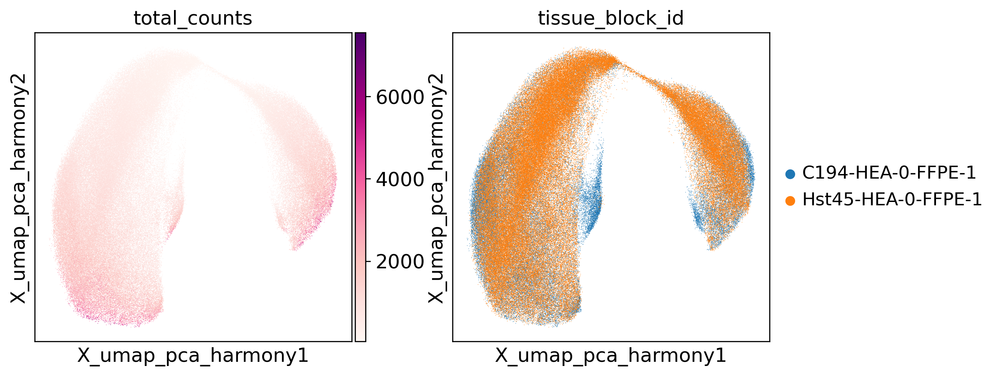

In [14]:
sc.pl.embedding(adata_lognorm, basis=f"X_umap_{key_added}",
                color=['total_counts','tissue_block_id'], wspace=0.2, cmap='RdPu')

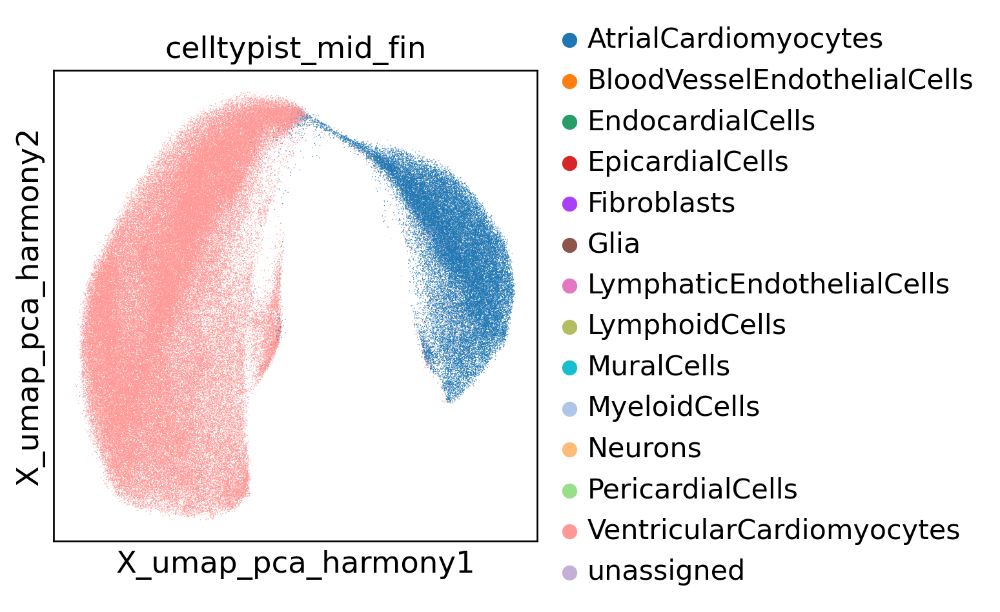

In [15]:
sc.pl.embedding(adata_lognorm, basis=f"X_umap_{key_added}",
                color=['celltypist_mid_fin'], wspace=0.2, cmap='RdPu')

# Clustering

In [16]:
%%time
latent_space='pca_harmony'
leiden_keys=[]
for res in tqdm([0.2,0.3,0.4,0.5,0.8,1.0,1.5,2.0,3.0]):
    leiden_key = f"leiden_{res}"
    key_added=f"{latent_space}_{leiden_key}"
    sc.tl.leiden(adata_lognorm,neighbors_key=latent_space,resolution=res,key_added=key_added,
                n_iterations=2)
    leiden_keys.append(key_added)

  0%|          | 0/9 [00:00<?, ?it/s]<timed exec>:6: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
100%|██████████| 9/9 [06:59<00:00, 46.62s/it]

CPU times: user 6min 55s, sys: 3.9 s, total: 6min 59s
Wall time: 6min 59s


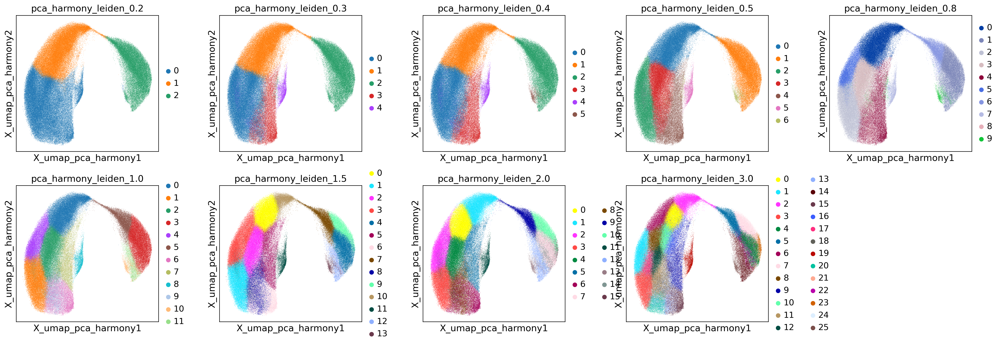

In [17]:
sc.pl.embedding(adata_lognorm,basis=f"X_umap_{latent_space}",
                color=leiden_keys,wspace=0.3,ncols=5)

# Marker expressions

In [18]:
# select leiden resolution
resolution_sel = '3.0'
leiden_key_sel = f'pca_harmony_leiden_{resolution_sel}'

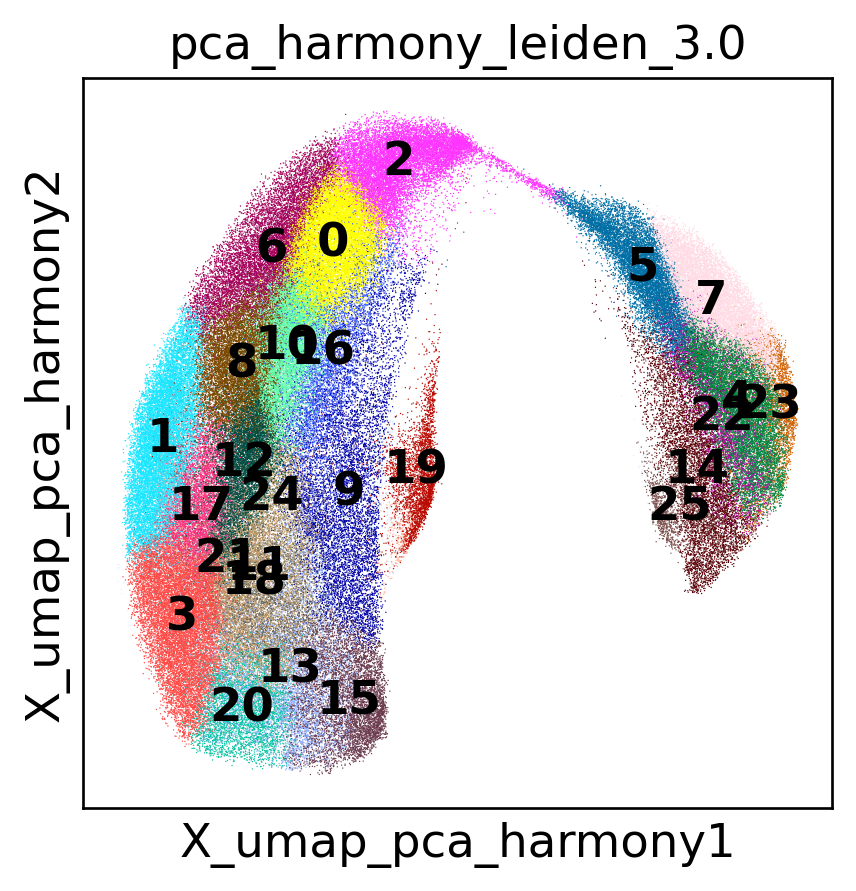

In [19]:
sc.settings.set_figure_params(dpi=120)
sc.pl.embedding(adata_lognorm,
                    basis=f"X_umap_{latent_space}",
                    color=leiden_key_sel,
                   legend_loc='on data'
                   )
sc.settings.set_figure_params(dpi=80)

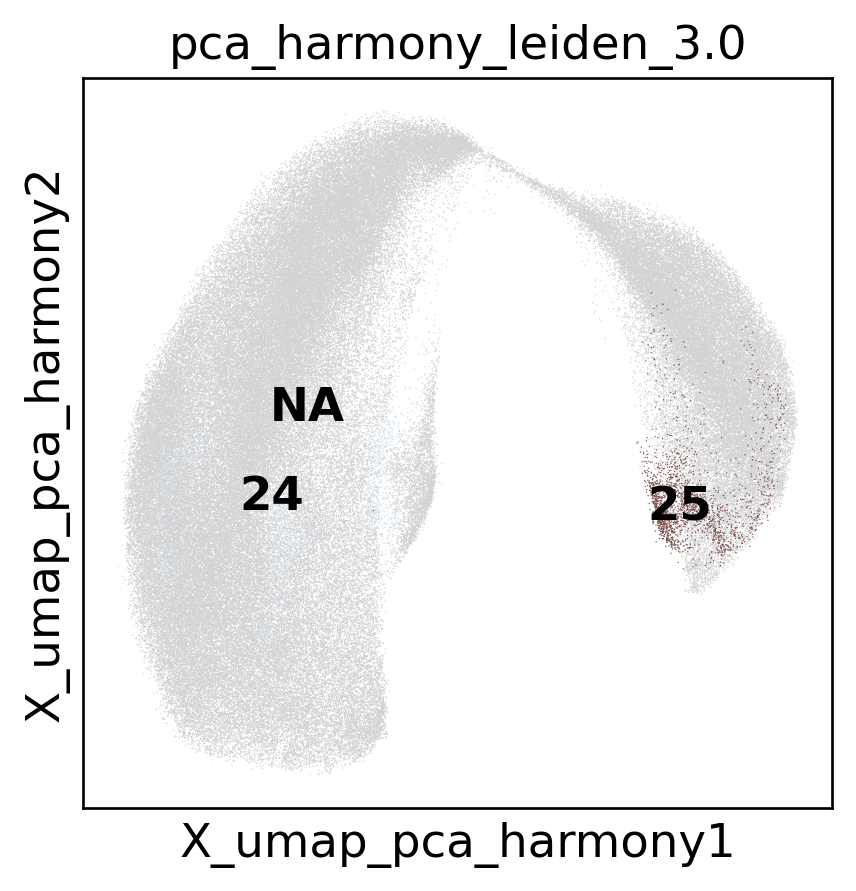

In [20]:
sc.settings.set_figure_params(dpi=120)
sc.pl.embedding(adata_lognorm,
                    basis=f"X_umap_{latent_space}",
                    color=leiden_key_sel,groups=['24','25'],
                   legend_loc='on data'
                   )
sc.settings.set_figure_params(dpi=80)

categories: 0, 1, 2, etc.
var_group_labels: CM, vCM, aCM, etc.


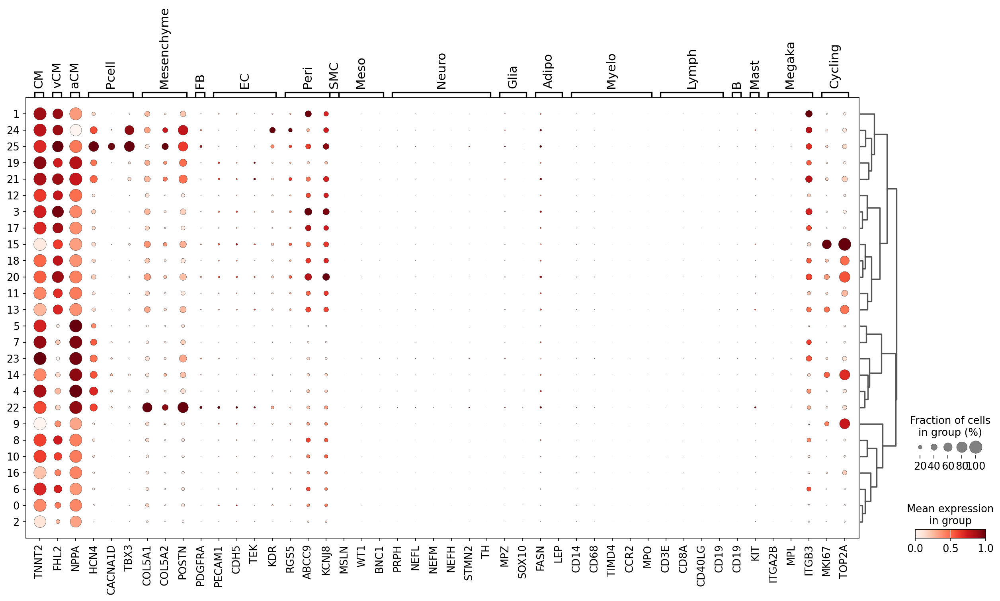

In [21]:
markers = {
    'CM': ['TTN', 'TNNT2','MYH6'],
    'vCM': ['MYH7', 'MYL2', 'FHL2'],
    'aCM': ['NPPA', 'MYL7', 'MYL4'],
    'Pcell':['HCN1','HCN4','CACNA1D','TBX3','SHOX2'],
    'Mesenchyme':['COL5A1','COL5A2','POSTN'], # markers in the Xenium5000 panel
    'FB': ['DCN', 'GCN', 'PDGFRA','COL1A1','COL1A2'],
    'EC': ['VWF', 'PECAM1', 'CDH5','RGCC', 'FABP5','TEK','KDR','LYVE1','CCL21'],
    'Peri': ['RGS5', 'ABCC9', 'KCNJ8'],
    'SMC': ['MYH11', 'TAGLN', 'ACTA2'],
    'Meso': ['MSLN', 'WT1', 'BNC1'],
    'Neuro': ['PLP1', 'NRXN1', 'NRXN3','PRPH', 'NEFL', 'NEFM', 'NEFH', 'STMN2', 'SST', 'SLC10A4', 'SLC18A3', 'TH', 'NPY'],
    'Glia':['MPZ','PLP1','SOX10'],
    'Adipo': ['GPAM', 'FASN', 'LEP'],
    'Myelo': ['CD14', 'C1QA', 'CD68','LYVE1','TIMD4','CCR2','MPO'],
    'Lymph': ['CD3E','CD3D','CD8A','IL7R', 'CD40LG','CD19','SDC1','IGHG1','IGHA1'],
    'B': ['CD19','SDC1','IGHG1','IGHA1'],
    'Mast': ['KIT', 'CPA3'],
    'Megaka':['ITGA2B','MPL','ITGB3', 'TUBB1', 'PPBP'],
    'Cycling':['MKI67','TOP2A'],
}

for key in markers.keys():
    markers[key]=[x for x in markers[key] if x in adata_lognorm.var_names]

sc.tl.dendrogram(adata_lognorm, groupby=leiden_key_sel)
sc.pl.dotplot(adata_lognorm,
              markers, 
              groupby=leiden_key_sel,
              dendrogram=True,
              standard_scale="var",
              color_map="Reds",
              swap_axes=False,
             )

/home/kk837/.conda/envs/generic_env/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:458: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/home/kk837/.conda/envs/generic_env/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:460: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
/home/kk837/.conda/envs/generic_env/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:463: Perf

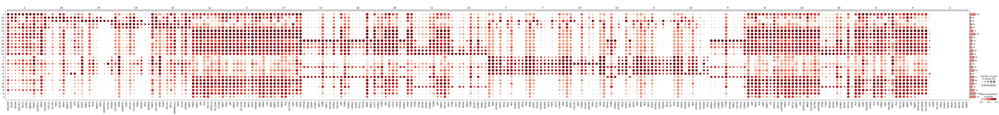

In [22]:
# DEG analysis
adata_lognorm.uns['log1p']['base']=None
sc.tl.rank_genes_groups(adata_lognorm,groupby=leiden_key_sel)
sc.tl.dendrogram(adata_lognorm, groupby=leiden_key_sel)
dp=sc.pl.rank_genes_groups_dotplot(adata_lognorm, dendrogram=True, standard_scale='var', return_fig=True)
dp.add_totals().show()

# QC metrices

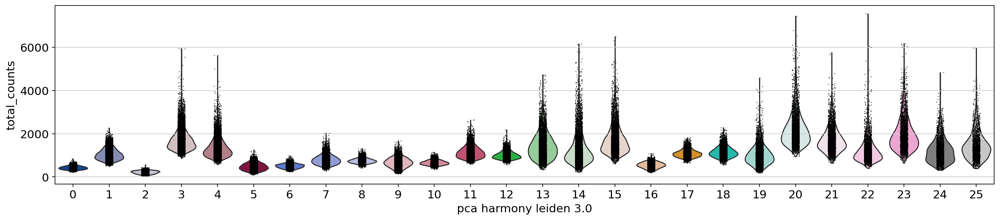

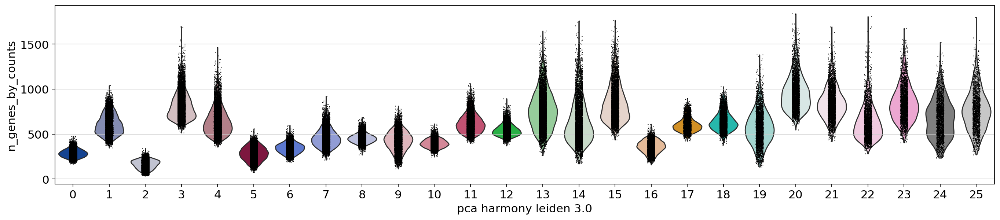

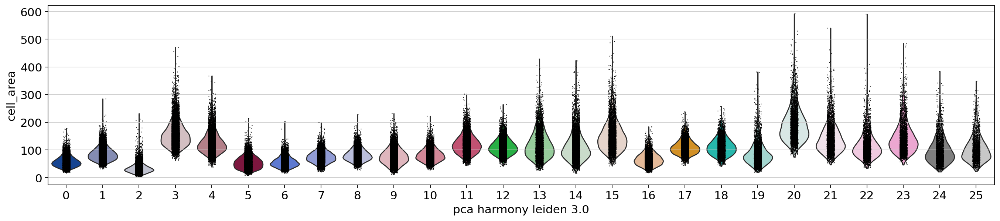

In [23]:
plt.rcParams['figure.figsize'] = 16,4
sc.pl.violin(adata_lognorm,keys=['total_counts'],groupby=leiden_key_sel)
sc.pl.violin(adata_lognorm,keys=['n_genes_by_counts'],groupby=leiden_key_sel)
sc.pl.violin(adata_lognorm,keys=['cell_area'],groupby=leiden_key_sel)

sc.settings.set_figure_params(dpi=120)

In [24]:
df = adata_lognorm.obs[[leiden_key_sel,'total_counts','n_genes_by_counts','cell_area']].groupby(leiden_key_sel).mean()
df.sort_values('n_genes_by_counts')[:20]

/tmp/ipykernel_672454/3854297.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df = adata_lognorm.obs[[leiden_key_sel,'total_counts','n_genes_by_counts','cell_area']].groupby(leiden_key_sel).mean()


,total_counts,n_genes_by_counts,cell_area
pca_harmony_leiden_3.0,,,
2,218.321671,164.096696,34.274864
5,476.041992,284.121725,56.212835
0,425.547668,287.636956,58.403342
6,507.911469,344.007521,57.398258
16,551.225647,361.360491,67.781079
10,660.222412,399.114876,83.168412
9,677.093750,426.932880,78.009735
8,747.274475,453.575436,83.160158
7,800.652405,458.401297,75.502625


# Annotate

In [25]:
# Annotate and make a new column
adata_lognorm.obs['coarse_grain_pre'] = adata_lognorm.obs[leiden_key_sel].copy()
adata_lognorm.obs['coarse_grain_pre'] = adata_lognorm.obs['coarse_grain_pre'].astype('str')
adata_lognorm.obs.replace({'coarse_grain_pre': {
    '0': 'VentricularCardiomyocytes', 
    '1': 'VentricularCardiomyocytes',
    '2': 'LowCountCells',
    '3': 'VentricularCardiomyocytes',
    '4': 'AtrialCardiomyocytes',
    '5': 'AtrialCardiomyocytes',
    '6': 'VentricularCardiomyocytes',
    '7': 'AtrialCardiomyocytes',
    '8': 'VentricularCardiomyocytes',
    '9': 'VentricularCardiomyocytes',
    '10': 'VentricularCardiomyocytes',
    '11': 'VentricularCardiomyocytes',
    '12': 'VentricularCardiomyocytes',
    '13': 'VentricularCardiomyocytes',
    '14': 'AtrialCardiomyocytes',
    '15': 'VentricularCardiomyocytes',
    '16': 'VentricularCardiomyocytes',
    '17': 'VentricularCardiomyocytes',
    '18': 'VentricularCardiomyocytes',
    '19': 'VentricularCardiomyocytes',
    '20': 'VentricularCardiomyocytes',
    '21': 'VentricularCardiomyocytes',
    '22': 'unclassified_mixture',
    '23': 'AtrialCardiomyocytes',
    '24': 'VentricularCardiomyocytes',
    '25': 'AtrialCardiomyocytes',
}}, inplace=True)
adata_lognorm.obs['coarse_grain_pre'].value_counts()

coarse_grain_pre
VentricularCardiomyocytes    128532
AtrialCardiomyocytes          39138
LowCountCells                 12348
unclassified_mixture           3208
Name: count, dtype: int64

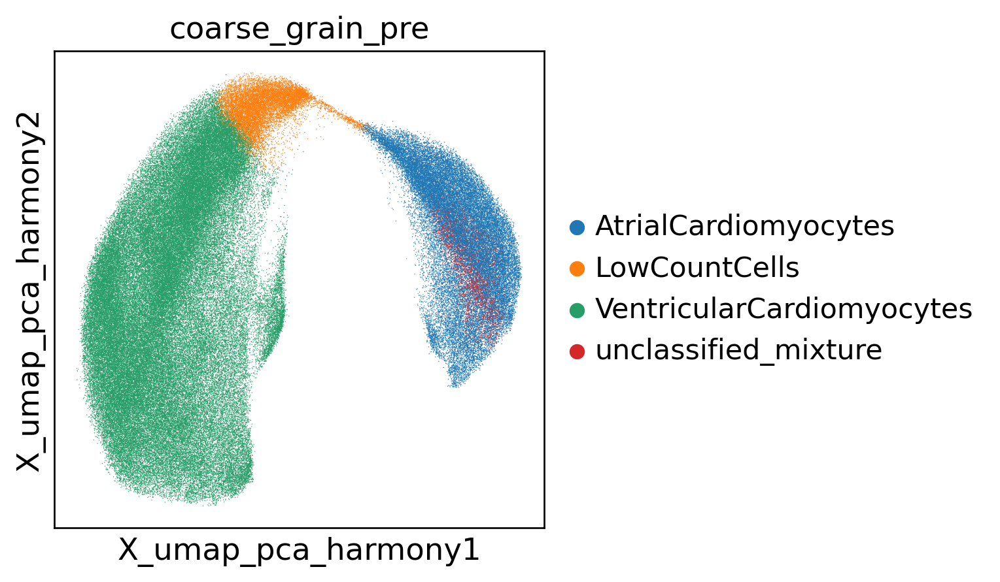

In [26]:
# plot celltypist prediction, for reference
sc.pl.embedding(adata_lognorm,
                    basis=f"X_umap_{latent_space}",
                    color=['coarse_grain_pre'],
                   ncols=4,wspace=0.7
                   )

categories: AtrialCardiomyocytes, LowCountCells, VentricularCardiomyocytes, etc.
var_group_labels: CM, vCM, aCM, etc.


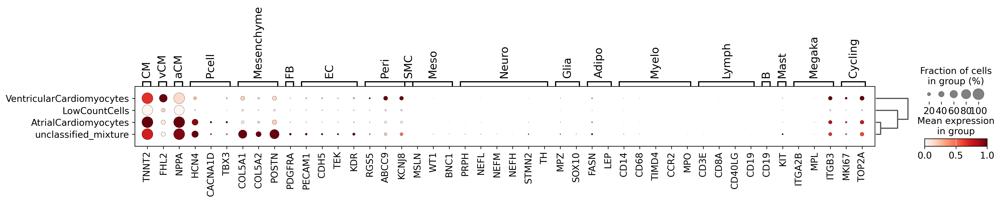

In [27]:
markers = {
    'CM': ['TTN', 'TNNT2','MYH6'],
    'vCM': ['MYH7', 'MYL2', 'FHL2'],
    'aCM': ['NPPA', 'MYL7', 'MYL4'],
    'Pcell':['HCN1','HCN4','CACNA1D','TBX3','SHOX2'],
    'Mesenchyme':['COL5A1','COL5A2','POSTN'], # markers in the Xenium5000 panel
    'FB': ['DCN', 'GCN', 'PDGFRA','COL1A1','COL1A2'],
    'EC': ['VWF', 'PECAM1', 'CDH5','RGCC', 'FABP5','TEK','KDR','LYVE1','CCL21'],
    'Peri': ['RGS5', 'ABCC9', 'KCNJ8'],
    'SMC': ['MYH11', 'TAGLN', 'ACTA2'],
    'Meso': ['MSLN', 'WT1', 'BNC1'],
    'Neuro': ['PLP1', 'NRXN1', 'NRXN3','PRPH', 'NEFL', 'NEFM', 'NEFH', 'STMN2', 'SST', 'SLC10A4', 'SLC18A3', 'TH', 'NPY'],
    'Glia':['MPZ','PLP1','SOX10'],
    'Adipo': ['GPAM', 'FASN', 'LEP'],
    'Myelo': ['CD14', 'C1QA', 'CD68','LYVE1','TIMD4','CCR2','MPO'],
    'Lymph': ['CD3E','CD3D','CD8A','IL7R', 'CD40LG','CD19','SDC1','IGHG1','IGHA1'],
    'B': ['CD19','SDC1','IGHG1','IGHA1'],
    'Mast': ['KIT', 'CPA3'],
    'Megaka':['ITGA2B','MPL','ITGB3', 'TUBB1', 'PPBP'],
    'Cycling':['MKI67','TOP2A'],
}

for key in markers.keys():
    markers[key]=[x for x in markers[key] if x in adata_lognorm.var_names]

sc.tl.dendrogram(adata_lognorm, groupby=leiden_key_sel)
sc.pl.dotplot(adata_lognorm,
              markers, 
              groupby=['coarse_grain_pre'],
              dendrogram=True,
              standard_scale="var",
              color_map="Reds",
              swap_axes=False,
             )

# Save annotations

In [28]:
path_csv = f'{objects_dir}/C194-HEA-0-FFPE-1_Hst45-HEA-0-FFPE-1_concat_5K_filtered_{celltype_sel}_annotations.csv'
adata_lognorm.obs['coarse_grain_pre'].to_csv(path_csv)

In [29]:
path_csv

'/rfs/project/rfs-iCNyzSAaucw/kk837/data_objects/Foetal/Xenium/C194-HEA-0-FFPE-1_Hst45-HEA-0-FFPE-1_concat_5K_filtered_Cardiomyocytes_annotations.csv'